# Decision Tree

In [1]:
import sqlite3
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scikitplot as skplt
from sklearn.metrics import confusion_matrix
from sklearn.grid_search import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import roc_curve, auc

C:\Users\Friend\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
C:\Users\Friend\Anaconda3\lib\site-packages\sklearn\grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [2]:
#Data here used is preprocessed(deduplication,removal of html tags,punctuation,stop words,stemming)
con =sqlite3.connect(r'C:\Users\Friend\AI\AI_datasets\Amazon\cleaned_database.sqlite')
filtered_data  = pd.read_sql_query('SELECT * FROM Reviews WHERE Score != 3',con)
filtered_data = filtered_data.drop('index',axis = 1)
filtered_data['Score'] = filtered_data['Score'].map(lambda x: 1 if x == 'positive' else 0)
filtered_data = filtered_data.sort_values('Time')

In [3]:
data = filtered_data.head(100000)
data.columns

Index(['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator',
       'HelpfulnessDenominator', 'Score', 'Time', 'Summary', 'Text',
       'CleanedText'],
      dtype='object')

In [4]:
from sklearn import cross_validation

X_train, X_test, y_train, y_test = cross_validation.train_test_split(data['CleanedText'], data['Score'], test_size=0.3, random_state=0)
print(X_train.shape,y_train.shape,X_test.shape,y_test.shape)

(70000,) (70000,) (30000,) (30000,)


In [10]:
y_train = np.array(y_train)
y_test = np.array(y_test)

In [5]:
max_depth = [1, 5, 10, 50, 100, 500, 100]
print(max_depth)

[1, 5, 10, 50, 100, 500, 100]


# BOW

In [6]:
# Performing BOW on review

from sklearn.feature_extraction.text import CountVectorizer
count_vect = CountVectorizer(min_df = 10)
vocabulary = count_vect.fit(X_train)

feature_names = count_vect.get_feature_names()

In [7]:
bag_of_words_train = count_vect.transform(X_train)
print(bag_of_words_train.shape)

(70000, 7131)


In [8]:
bag_of_words_test = count_vect.transform(X_test)
print(bag_of_words_test.shape)

(30000, 7131)


In [15]:
train_score = []
test_score = []

for depth in max_depth:
    model = DecisionTreeClassifier(class_weight = 'balanced',max_depth = depth)
    model.fit(bag_of_words_train, y_train)
    
    train_pred = model.predict_proba(bag_of_words_train)
    false_positive_rate, true_positive_rate,thresholds = roc_curve(y_train, train_pred[:,1])
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_score.append(roc_auc)
    
    test_pred = model.predict_proba(bag_of_words_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,test_pred[:,1])
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_score.append(roc_auc)

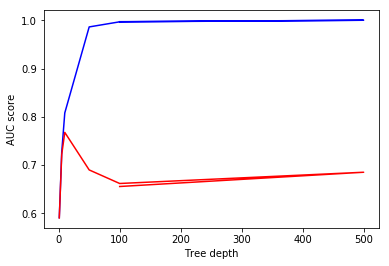

In [16]:
plt.plot(max_depth, train_score,'b', label='Train AUC')
plt.plot(max_depth, test_score, 'r', label='Test AUC')
    
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.show()

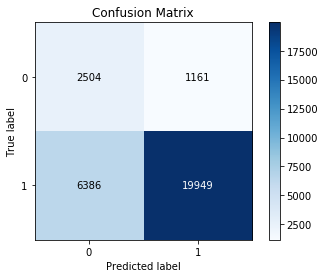

In [25]:
bow_grid_model = DecisionTreeClassifier(class_weight = 'balanced',max_depth = 10)
bow_grid_model.fit(bag_of_words_train, y_train)

train_pred = bow_grid_model.predict_proba(bag_of_words_train)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train,train_pred[:,1])
bow_grid_model_train = auc(false_positive_rate, true_positive_rate)

test_pred = bow_grid_model.predict_proba(bag_of_words_test)
test_predct = bow_grid_model.predict(bag_of_words_test)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,test_pred[:,1])
bow_grid_model_test = auc(false_positive_rate, true_positive_rate)

skplt.metrics.plot_confusion_matrix(y_test, test_predct, normalize=False)

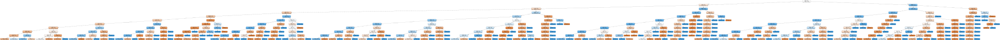

In [26]:
import graphviz 

dot_data = tree.export_graphviz(bow_grid_model,out_file=None,filled=True, rounded=True, special_characters=False, impurity=False,feature_names = feature_names) 
graph = graphviz.Source(dot_data) 
graph

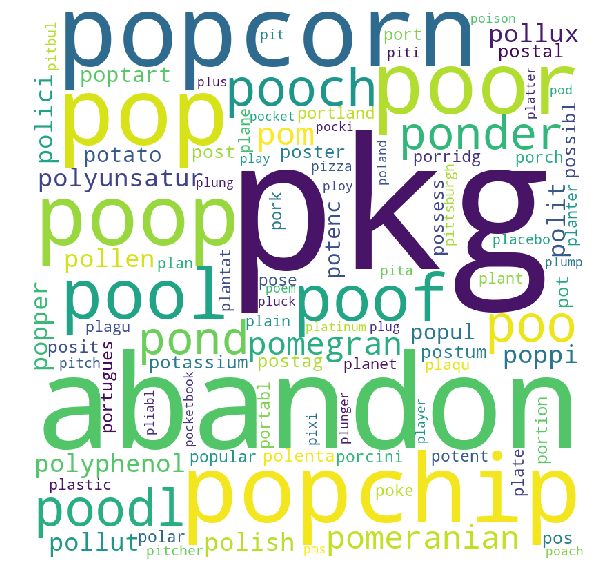

In [31]:
from wordcloud import WordCloud

indices = np.argsort(bow_grid_model.feature_importances_)
features = [np.take(count_vect.get_feature_names(),index)  for index in indices[0:100]]

featurez=(" ").join(features)
wordcloud = WordCloud(width = 800, height = 800,background_color ='white',min_font_size = 10).generate(featurez) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

# TFIDF

In [37]:
from sklearn.feature_extraction.text import TfidfVectorizer
tf_idf_vect = TfidfVectorizer(min_df = 10)
vocabulary = tf_idf_vect.fit(X_train)

In [38]:
tf_idf_train = tf_idf_vect.transform(X_train)
print(tf_idf_train.shape)

(70000, 7131)


In [39]:
tf_idf_test = tf_idf_vect.transform(X_test)
print(tf_idf_test.shape)

(30000, 7131)


In [41]:
train_score = []
test_score = []

for depth in max_depth:
    model = DecisionTreeClassifier(class_weight = 'balanced',max_depth = depth)
    model.fit(tf_idf_train, y_train)
    
    train_pred = model.predict_proba(tf_idf_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred[:,1])
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_score.append(roc_auc)
    
    test_pred = model.predict_proba(tf_idf_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,test_pred[:,1])
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_score.append(roc_auc)

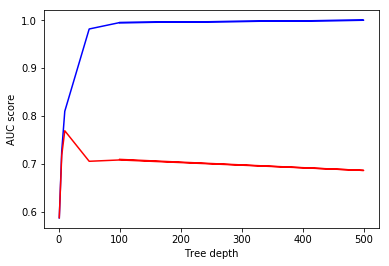

In [42]:
plt.plot(max_depth, train_score,'b', label='Train AUC')
plt.plot(max_depth, test_score, 'r', label='Test AUC')
    
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.show()

0.810043223937983
0.7684279709100216


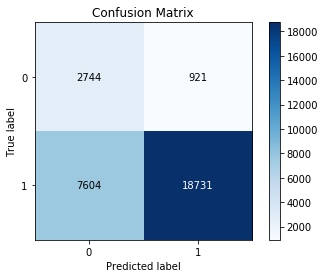

In [45]:
tfidf_grid_model = DecisionTreeClassifier(class_weight = 'balanced',max_depth = 10)
tfidf_grid_model.fit(tf_idf_train, y_train)

train_pred = tfidf_grid_model.predict_proba(tf_idf_train)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train,train_pred[:,1])
tfidf_grid_model_train = auc(false_positive_rate, true_positive_rate)
print(tfidf_grid_model_train)

test_pred = tfidf_grid_model.predict_proba(tf_idf_test)
test_predct = tfidf_grid_model.predict(tf_idf_test)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,test_pred[:,1])
tfidf_grid_model_test = auc(false_positive_rate, true_positive_rate)
print(tfidf_grid_model_test)

skplt.metrics.plot_confusion_matrix(y_test,test_predct, normalize=False)

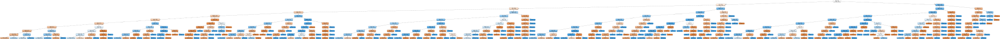

In [46]:
import graphviz 

dot_data = tree.export_graphviz(tfidf_grid_model,out_file=None,filled=True, rounded=True, special_characters=False, impurity=False,feature_names = tf_idf_vect.get_feature_names()) 
graph = graphviz.Source(dot_data) 
graph

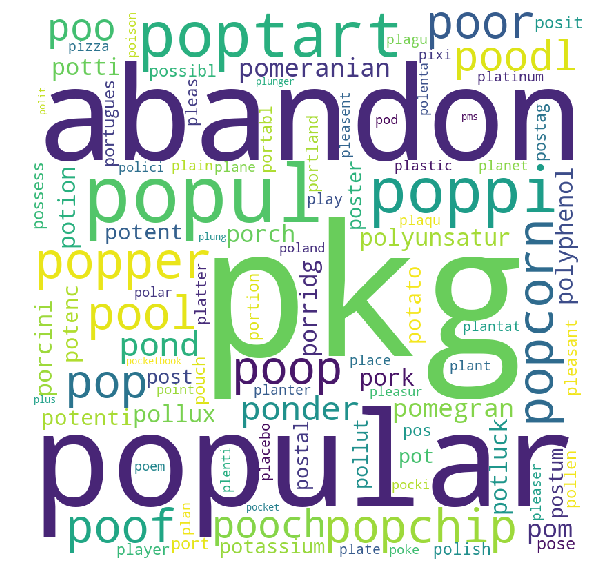

In [47]:
from wordcloud import WordCloud

indices = np.argsort(tfidf_grid_model.feature_importances_)
features = [np.take(tf_idf_vect.get_feature_names(),index)  for index in indices[0:100]]

featurez=(" ").join(features)
wordcloud = WordCloud(width = 800, height = 800,background_color ='white',min_font_size = 10).generate(featurez) 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()  

# Avg word2vec

In [85]:
from gensim.models import Word2Vec

list_of_sent=[]
for sent in X_train:
    list_of_sent.append(sent.split())

#word2vec
w2v_model=Word2Vec(list_of_sent,min_count=5,size=50, workers=4)
w2v_words = list(w2v_model.wv.vocab)

#Average word2vec
sent_vectors_train = []; 
for sent in list_of_sent: 
    sent_vec = np.zeros(50) 
    cnt_words =0; 
    for word in sent: 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_train.append(sent_vec)

C:\Users\Friend\Anaconda3\lib\site-packages\gensim\utils.py:1209: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [86]:
from gensim.models import Word2Vec

i=0
list_of_sent=[]
for sent in X_test:
    list_of_sent.append(sent.split())

#Average word2vec
sent_vectors_test = []; 
for sent in list_of_sent: 
    sent_vec = np.zeros(50) 
    cnt_words =0; 
    for word in sent: 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_test.append(sent_vec)

In [87]:
train_score = []
test_score = []

for depth in max_depth:
    model = DecisionTreeClassifier(class_weight = 'balanced',max_depth = depth)
    model.fit(sent_vectors_train, y_train)
    
    train_pred = model.predict(sent_vectors_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_score.append(roc_auc)
    
    test_pred = model.predict(sent_vectors_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,test_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_score.append(roc_auc)

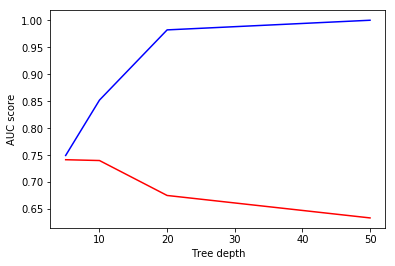

In [88]:
plt.plot(max_depth, train_score,'b', label='Train AUC')
plt.plot(max_depth, test_score, 'r', label='Test AUC')
    
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.show()

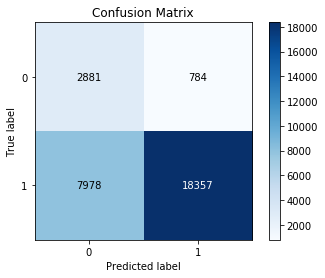

In [94]:
avgw2vec_grid_model = DecisionTreeClassifier(class_weight = 'balanced',max_depth = 5)
avgw2vec_grid_model.fit(sent_vectors_train, y_train)

train_pred = avgw2vec_grid_model.predict(sent_vectors_train)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train,train_pred)
avgw2vec_grid_model_train = auc(false_positive_rate, true_positive_rate)

test_pred = avgw2vec_grid_model.predict(sent_vectors_test)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,test_pred)
avgw2vec_grid_model_test = auc(false_positive_rate, true_positive_rate)

skplt.metrics.plot_confusion_matrix(y_test,test_pred, normalize=False)

In [102]:
import graphviz
dot_data = tree.export_graphviz(clf, out_file=None)
graph = graphviz.Source(dot_data)
graph

# tfidf weighted word2vec

In [70]:
cons = sqlite3.connect(r'C:\Users\Friend\AI\AI_datasets\Amazon\featurizations.sqlite')
cursor = cons.cursor()
cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
print(cursor.fetchall())

[('Reviews',), ('check',), ('df',), ('tfidfword2vec_train',), ('tf_idf_test',)]


In [71]:
cons =sqlite3.connect(r'C:\Users\Friend\AI\AI_datasets\Amazon\featurizations.sqlite')
tfidf_sent_vectors_train  = pd.read_sql_query('SELECT * FROM tfidfword2vec_train',cons)
tfidf_sent_vectors_train = tfidf_sent_vectors_train.drop('index',axis = 1)
tfidf_sent_vectors_train.shape

(70000, 50)

In [72]:
cons =sqlite3.connect(r'C:\Users\Friend\AI\AI_datasets\Amazon\featurizations.sqlite')
tfidf_sent_vectors_test  = pd.read_sql_query('SELECT * FROM tf_idf_test',cons)
tfidf_sent_vectors_test = tfidf_sent_vectors_test.drop('index',axis = 1)
tfidf_sent_vectors_test.shape

(30000, 50)

In [75]:
train_score = []
test_score = []

for depth in max_depth:
    model = DecisionTreeClassifier(class_weight = 'balanced',max_depth = depth)
    model.fit(tfidf_sent_vectors_train, y_train)
    
    train_pred = model.predict(tfidf_sent_vectors_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_score.append(roc_auc)
    
    test_pred = model.predict(tfidf_sent_vectors_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,test_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_score.append(roc_auc)

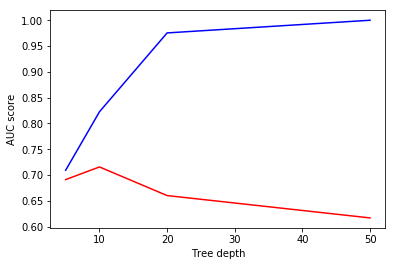

In [76]:
plt.plot(max_depth, train_score,'b', label='Train AUC')
plt.plot(max_depth, test_score, 'r', label='Test AUC')
    
plt.ylabel('AUC score')
plt.xlabel('Tree depth')
plt.show()

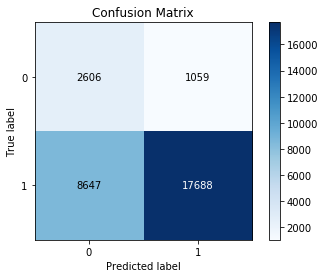

In [83]:
w2vec_grid_model = DecisionTreeClassifier(class_weight = 'balanced',max_depth = 5)
w2vec_grid_model.fit(tfidf_sent_vectors_train, y_train)

train_pred = w2vec_grid_model.predict(tfidf_sent_vectors_train)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train,train_pred)
w2vec_grid_model_train = auc(false_positive_rate, true_positive_rate)

test_pred = w2vec_grid_model.predict(tfidf_sent_vectors_test)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,test_pred)
w2vec_grid_model_test = auc(false_positive_rate, true_positive_rate)

skplt.metrics.plot_confusion_matrix(y_test,test_pred, normalize=False)

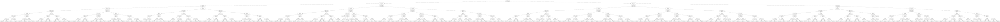

In [79]:
import graphviz
dot_data = tree.export_graphviz(w2vec_grid_model, out_file=None)
graph = graphviz.Source(dot_data)
graph

# Conclusion

In [48]:
from prettytable import PrettyTable
    
Table = PrettyTable()

Table.field_names  = ["Model", "Train auc-score", "Test auc-score"]

Table.add_row(["grid_BOW", bow_grid_model_train,bow_grid_model_test])
Table.add_row(["grid_TF_IDF",tfidf_grid_model_train, tfidf_grid_model_test])
Table.add_row(["grid_avgw2vec",avgw2vec_grid_model_train,avgw2vec_grid_model_test])
Table.add_row(["grid_ww2vec",  w2vec_grid_model_train,w2vec_grid_model_test])

print(Table)

+---------------+--------------------+--------------------+
|     Model     |  Train auc-score   |   Test auc-score   |
+---------------+--------------------+--------------------+
|    grid_BOW   | 0.8080595131739432 | 0.7673781072968167 |
|  grid_TF_IDF  | 0.810043223937983  | 0.7684279709100216 |
| grid_avgw2vec | 0.7494677213974306 | 0.7415708660917639 |
|  grid_ww2vec  | 0.7094475807638189 | 0.6913520851470105 |
+---------------+--------------------+--------------------+
